In [ ]:
!pip install pandas_profiling==3.2.0
!pip install markupsafe===2.0.1

In [1]:
#импорт библиотек
import pandas as pd
import numpy as np
from google.cloud import bigquery
from google.oauth2 import service_account
from google.oauth2.service_account import Credentials
import pandas_profiling
from datetime import datetime, timedelta

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## **RFM: пользователи, установившие приложение в 2022**

In [2]:
app_transactions = pd.read_csv('/content/drive/MyDrive/app_transactions.csv', index_col=0, parse_dates=['install_date', 'order_date'])
app_transactions = app_transactions.drop(columns=['af_prt', 'campaign', 'city', 'device_type', 'region'])
app_transactions.head()

,media_source,install_date,platform,transaction_id,order_date,revenue,user_id,promo_code,discount,delivery_type,status_id
0,Apple Search Ads,2022-03-24,ios,25003718,2022-03-24 16:16:56,724.0,9477867,0,0.0,Обычная,F
1,mobyoung_int,2022-05-21,ios,27221979,2022-05-21 23:31:19,1574.0,5253169,0,0.0,Обычная,R
2,oceanmobi_int,2022-05-09,ios,26797355,2022-05-09 21:15:32,777.0,9218511,0,0.0,Обычная,F
3,atmoicads_int,2022-03-18,ios,24684694,2022-03-18 16:29:50,424.0,9555465,0,0.0,Обычная,F
4,glaucustech_int,2022-04-19,ios,26072151,2022-04-19 09:00:07,777.0,9953443,0,0.0,Обычная,R


In [3]:
pandas_profiling.ProfileReport(app_transactions)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
# убираем дубликаты, проверяем, чтобы дата заказа была позже даты установки, оставляем только выполненные заказы
user_data = app_transactions.drop_duplicates() \
                .query("order_date >= install_date") \
                .query("status_id == 'F'")[['user_id', 'revenue', 'discount', 'promo_code', 'transaction_id', 'order_date', 'media_source', 'install_date']]
user_data.revenue += user_data.discount
user_data.discount = user_data.discount > 0
user_data.order_date = user_data.order_date.dt.date
user_data.install_date = user_data.install_date.dt.date
user_data.head()

,user_id,revenue,discount,promo_code,transaction_id,order_date,media_source,install_date
0,9477867,724.0,False,0,25003718,2022-03-24,Apple Search Ads,2022-03-24
2,9218511,777.0,False,0,26797355,2022-05-09,oceanmobi_int,2022-05-09
3,9555465,424.0,False,0,24684694,2022-03-18,atmoicads_int,2022-03-18
5,10108382,2386.0,True,YES400,26659188,2022-05-05,glaucustech_int,2022-05-05
6,9966156,321.0,False,0,26481295,2022-04-30,glaucustech_int,2022-04-20


**дата последней установки по источникам (+границы 4.03 и 30.4):**  
посмотрим на источники, ставшие неактуальными с начала марта

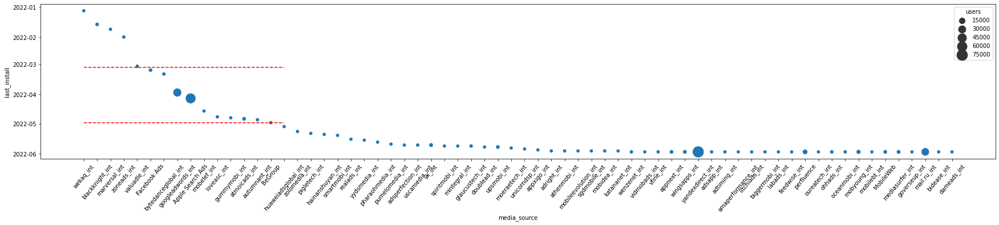

In [5]:
sources = user_data.groupby('media_source', as_index=False) \
          .agg({'install_date': 'max', 'user_id': 'count'}) \
          .sort_values('install_date') \
          .rename(columns={'user_id': 'users', 'install_date': 'last_install'})

plt.figure(figsize=(30, 5))
sns.scatterplot(data=sources, y='last_install', x='media_source', size='users', sizes=(40, 400))
plt.hlines((pd.to_datetime('2022-03-04'), pd.to_datetime('2022-04-30')), linestyle='--', colors='r', xmin=0, xmax=15)
plt.xticks(rotation=50, ha='center');

In [6]:
thresh = pd.to_datetime('2022-04-30')
sources.query("last_install > @thresh").sort_values('users', ascending=False).head(25).media_source.to_list()

/usr/local/lib/python3.7/dist-packages/pandas/core/ops/array_ops.py:73: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  result = libops.scalar_compare(x.ravel(), y, op)


['yandexdirect_int',
 'mail.ru_int',
 'perfluence',
 'mobyoung_int',
 'vk_int',
 'mediasurfer_int',
 'wingsapps_int',
 'MobileWeb',
 'appnext_int',
 'upsmobi_int',
 'ohhads_int',
 'glaucustech_int',
 'wenzenet_int',
 'uscamedia_int',
 'vfine_int',
 'oceanmobi_int',
 'adtiming_int',
 'smartmobi_int',
 'biggermobi_int',
 'pumelomedia_int',
 'labads_int',
 'bidease_int',
 'unicorndsp_int',
 'yydsmedia_int',
 'realads_int']

## Данные для RFM-анализа
группируем данные по пользователям, расчитываем кол-во дней с последней транзакции, кол-во транзакций, общую сумму заказов

In [7]:
last_date = user_data.order_date.max() + timedelta(days=1)
last_date

datetime.date(2022, 5, 31)

In [8]:
rfm = user_data.groupby('user_id', as_index=False) \
          .agg({'order_date': lambda x: last_date - x.max(), # дней с последней транзакции
                'transaction_id': pd.Series.nunique, # кол-во транзакций
                'revenue': 'sum',     # общая сумма заказов
                'discount': 'sum',
                'promo_code': 'count'}) 

rfm.order_date = rfm.order_date.astype('timedelta64[D]').apply(int)
rfm.rename(columns={'order_date': 'recency',
                   'transaction_id': 'frequency',
                   'revenue': 'monetary_value'}, inplace=True)

In [9]:
pandas_profiling.ProfileReport(rfm)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
#избавимся от выбросов в параметре frequency
rfm = rfm.query('frequency <= 10')

0.10     439.0
0.25     741.0
0.50    1414.0
0.75    2715.0
0.90    4858.0
0.95    7092.2
Name: monetary_value, dtype: float64

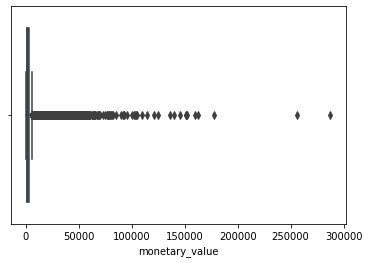

In [11]:
# посмотрим на распределение сумм заказов
sns.boxplot(x=rfm.monetary_value)
rfm.monetary_value.quantile([0.1, 0.25, 0.5, 0.75, 0.9, 0.95])

In [12]:
# избавимся от выбросов в суммах
max_monetary_value = rfm.monetary_value.quantile(0.95)
rfm = rfm.query("monetary_value <= @max_monetary_value")

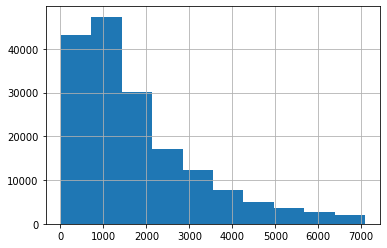

In [13]:
rfm.monetary_value.hist()

### Для сегментации применим метод k-средних

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

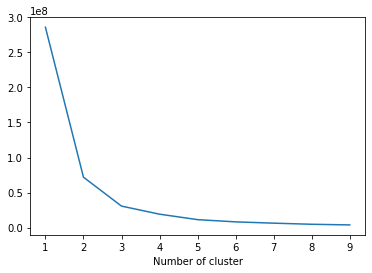

In [18]:
from sklearn.cluster import KMeans

sse={}
tx_recency = rfm[['recency']]

# определяем оптимальное кол-во кластеров
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=5000).fit(tx_recency)
    tx_recency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ 

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show();

In [15]:
# кол-во кластеров (по методу колена оптимально - 3)
clusters_no = 3

In [17]:
#строим 3 кластера для параметра давности и добавляем к датасету
kmeans = KMeans(n_clusters=clusters_no)
kmeans.fit(rfm[['recency']])
rfm['RecencyCluster'] = kmeans.predict(rfm[['recency']])

#назначаем номера кластерам
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

rfm = order_cluster('RecencyCluster', 'recency', rfm, False)
rfm.groupby('RecencyCluster')['frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
RecencyCluster,,,,,,,,
0,71735.0,1.167533,0.485961,1.0,1.0,1.0,1.0,9.0
1,58066.0,1.459167,0.901711,1.0,1.0,1.0,2.0,10.0
2,41500.0,1.863229,1.361568,1.0,1.0,1.0,2.0,10.0


### **frequency**

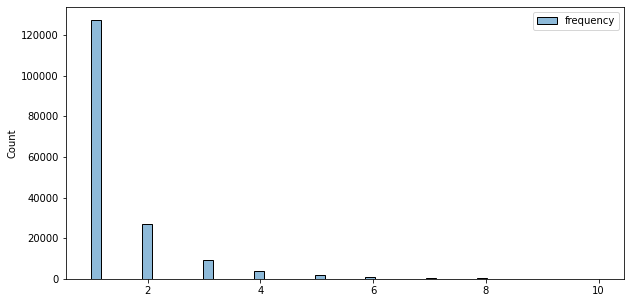

In [19]:
#посмотрим на распределение частот
tx_frequency = rfm[['frequency']]

plt.figure(figsize=(10, 5))
sns.histplot(tx_frequency, bins=50)

In [20]:
#k-means
kmeans = KMeans(n_clusters=clusters_no)
kmeans.fit(rfm[['frequency']])
rfm['FrequencyCluster'] = kmeans.predict(rfm[['frequency']])

#определяем кластеры частот
rfm = order_cluster('FrequencyCluster', 'frequency',rfm, True)

rfm.groupby('FrequencyCluster')['frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,127434.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
1,36459.0,2.259497,0.438365,2.0,2.0,2.0,3.0,3.0
2,7408.0,4.858531,1.225915,4.0,4.0,4.0,5.0,10.0


### **monetary_value**

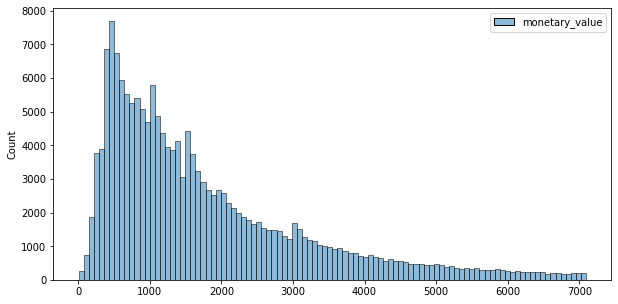

In [21]:
#доход на каждого пользователя

tx_revenue = rfm[['monetary_value']]

plt.figure(figsize=(10, 5))
sns.histplot(tx_revenue, bins=100)


In [22]:
#кластеризация
kmeans = KMeans(n_clusters=clusters_no)
kmeans.fit(rfm[['monetary_value']])
rfm['RevenueCluster'] = kmeans.predict(rfm[['monetary_value']])

rfm = order_cluster('RevenueCluster', 'monetary_value', rfm, True)

rfm.groupby('RevenueCluster')['monetary_value'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,105716.0,883.749999,424.335972,8.0,517.0,845.0,1222.0,1723.14
1,47651.0,2555.509226,585.184296,1724.0,2038.0,2459.0,3030.0,3804.00
2,17934.0,5042.400316,905.924194,3805.0,4258.0,4866.0,5710.0,7092.00


### **Общее кол-во баллов**

In [23]:
rfm['OverallScore'] = rfm['RecencyCluster'] + rfm['FrequencyCluster'] + rfm['RevenueCluster']
rfm.groupby('OverallScore')['recency','frequency','monetary_value'].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,recency,frequency,monetary_value
OverallScore,,,
0,125.994978,1.000000,839.806134
1,102.563101,1.092645,1336.896723
2,66.982319,1.276788,1776.327919
3,60.395711,1.778170,2732.725421
4,47.354298,2.459149,3529.495794
5,36.524856,3.616841,4444.994702
6,23.478474,5.222054,5262.414717


In [24]:
# распределяем на сегменты по сумме баллов
rfm['Segment'] = 'Low-Value'
rfm.loc[rfm['OverallScore']>1,'Segment'] = 'Mid-Value' 
rfm.loc[rfm['OverallScore']>4,'Segment'] = 'High-Value'
rfm 

,user_id,recency,frequency,monetary_value,discount,promo_code,RecencyCluster,FrequencyCluster,RevenueCluster,OverallScore,Segment
0,780,122,1,2592.0,0,1,0,0,1,1,Low-Value
1,2747,138,1,2842.0,0,1,0,0,1,1,Low-Value
2,5064,120,1,2197.0,1,1,0,0,1,1,Low-Value
3,5708,132,1,2800.0,0,1,0,0,1,1,Low-Value
4,6527,140,1,2885.0,0,1,0,0,1,1,Low-Value
...,...,...,...,...,...,...,...,...,...,...,...
171296,10133718,9,4,5691.0,0,4,2,2,2,6,High-Value
171297,10168489,6,5,4871.0,0,5,2,2,2,6,High-Value
171298,10197144,5,4,4154.0,0,4,2,2,2,6,High-Value
171299,10222375,2,4,4400.0,0,4,2,2,2,6,High-Value


In [26]:
# размер сегментов
rfm.groupby('Segment').agg({'user_id': 'count'})

,user_id
Segment,
High-Value,8562
Low-Value,92154
Mid-Value,70585


In [28]:
# в долях
rfm.Segment.value_counts(normalize=True)

Low-Value     0.537965
Mid-Value     0.412052
High-Value    0.049982
Name: Segment, dtype: float64

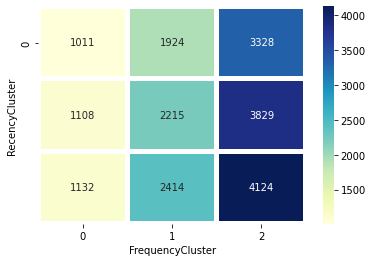

In [29]:
# построим тепловую карту (цвет - сумма медианного дохода в сегменте)
rfmTable = rfm.pivot_table(
                        index='RecencyCluster', 
                        columns='FrequencyCluster', 
                        values='monetary_value', 
                        aggfunc=np.median).applymap(int)
sns.heatmap(rfmTable, cmap="YlGnBu", annot=True, fmt=".0f", linewidths=4.15, annot_kws={"size": 10}, yticklabels=4)

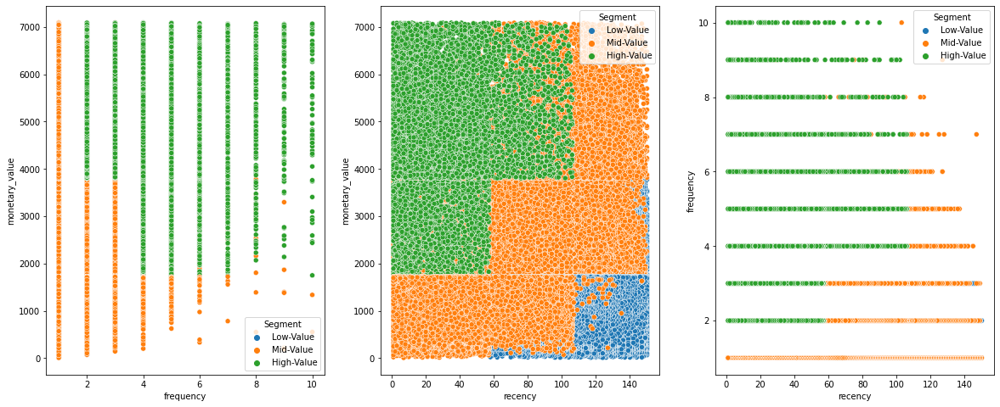

In [30]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, nrows=1, figsize=(20, 8))
sns.scatterplot(data=rfm, x='frequency', y='monetary_value', hue='Segment', ax=ax1)
sns.scatterplot(data=rfm, x='recency', y='monetary_value', hue='Segment', ax=ax2)
sns.scatterplot(data=rfm, x='recency', y='frequency', hue='Segment', ax=ax3)

## **сегмент наименее лояльных**
**(сегмент с наименьшими показателями давности и дохода, а также включающий покупателей, которые входили в сегменты mid-value, но давно не делавшие заказов**

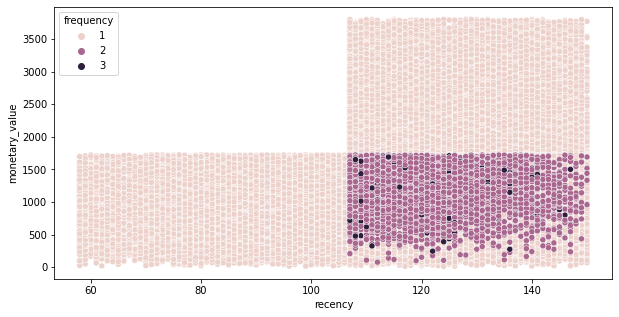

In [31]:
plt.figure(figsize=(10, 5))
sns.scatterplot(data=rfm.query("Segment == 'Low-Value'"), x='recency', y='monetary_value', hue='frequency')

In [32]:
low_level_segment = rfm.query("Segment == 'Low-Value'")[['user_id']] \
                                  .merge(user_data, on='user_id') \
                                  .astype({'order_date': 'datetime64', 'install_date': 'datetime64'})
pandas_profiling.ProfileReport(low_level_segment)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [33]:
# уберем дубликаты, проверим транзакции на уникальность
low_level_segment.drop_duplicates(inplace=True)
low_level_segment.transaction_id.duplicated().sum()

0

In [36]:
# сколько дней проходит с установки до первой покупки (распределение в %)
def days_to_first_purchase(df):
  days_to_first_purchase = df.groupby('user_id', as_index=False) \
                                  .agg({'order_date': 'min', 'install_date': 'min', 'transaction_id': 'count'}) \
                                  .rename(columns={'order_date': 'first_order_date'})
  days_to_first_purchase['days_to_first_purchase'] =days_to_first_purchase.first_order_date - days_to_first_purchase.install_date
  days_to_first_purchase['days_to_first_purchase'] = days_to_first_purchase.days_to_first_purchase.astype('timedelta64[D]').apply(int)
  
  return days_to_first_purchase['days_to_first_purchase'].value_counts(normalize=True).to_frame().mul(100).round(2).head(10)


In [37]:
days_to_first_purchase(low_level_segment)

,days_to_first_purchase
0,73.85
1,8.33
2,2.17
3,1.34
4,1.12
5,0.88
6,0.78
7,0.69
8,0.54
9,0.50


## **что делать с сегментом "средних"?**
**(кластер с приличными показателями давности и дохода, а также включающий покупателей, которые входили в сегменты high-value, но давно не делавшие заказов):**  
стимулировать к повторным покупкам тех, кто несколько месяцев не покупал, чтобы переводить в сегмент лояльных

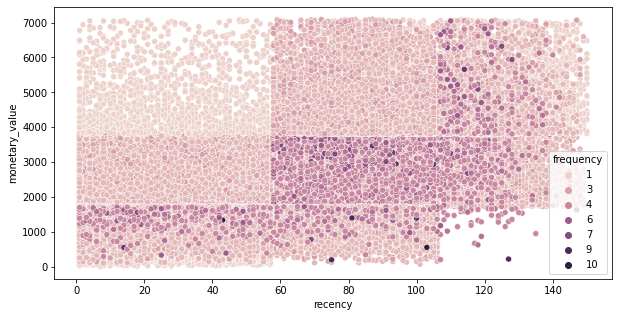

In [38]:
plt.figure(figsize=(10, 5))
sns.scatterplot(data=rfm.query("Segment == 'Mid-Value'"), x='recency', y='monetary_value', hue='frequency')

In [39]:
mid_level_segment = rfm.query("Segment == 'Mid-Value'")[['user_id']] \
                                  .merge(user_data, on='user_id') \
                                  .astype({'order_date': 'datetime64', 'install_date': 'datetime64'})
pandas_profiling.ProfileReport(mid_level_segment)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [40]:
mid_level_segment.drop_duplicates(inplace=True)
mid_level_segment.transaction_id.duplicated().sum()

0

## **что делать с сегментом "самых лояльных"?**
**(кластер с самыми лучшими показателями давности и дохода, регулярно делающий заказы):**  
да ничего не делаем в рамках ретаргетинга

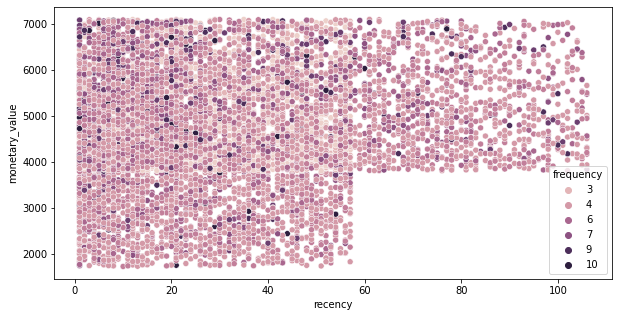

In [41]:
plt.figure(figsize=(10, 5))
sns.scatterplot(data=rfm.query("Segment == 'High-Value'"), x='recency', y='monetary_value', hue='frequency')

In [42]:
high_level_segment = rfm.query("Segment == 'High-Value'")[['user_id']] \
                                  .merge(user_data, on='user_id') \
                                  .astype({'order_date': 'datetime64', 'install_date': 'datetime64'})
pandas_profiling.ProfileReport(high_level_segment)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [43]:
high_level_segment.drop_duplicates(inplace=True)
high_level_segment.transaction_id.duplicated().sum()

0

In [45]:
low_days = days_to_first_purchase(low_level_segment) \
                  .rename(columns={'days_to_first_purchase': 'low_segment'})
mid_days = days_to_first_purchase(mid_level_segment) \
                  .rename(columns={'days_to_first_purchase': 'mid_segment'})
high_days = days_to_first_purchase(high_level_segment) \
                  .rename(columns={'days_to_first_purchase': 'high_segment'})
pd.concat([low_days, mid_days, high_days], axis=1)

,low_segment,mid_segment,high_segment
0,73.85,60.49,53.45
1,8.33,7.62,8.92
2,2.17,2.27,3.50
3,1.34,1.50,2.39
4,1.12,1.15,1.94
5,0.88,0.99,1.44
6,0.78,0.85,1.35
7,0.69,0.83,1.31
8,0.54,0.66,1.18
9,0.50,0.67,1.04


### **Сумма заказов по дням со дня установки**

In [46]:
a = user_data.copy()
a['day_order'] = a.order_date - a.install_date
a.day_order = a['day_order'].apply(lambda x: int(str(x).split()[0]))
a_g = a.groupby('day_order', as_index=False).agg({'revenue': 'sum', 'user_id': pd.Series.nunique, 'transaction_id': 'count'}).sort_values('revenue', ascending=False)

In [47]:
# по кол-ву дней с даты установки
a_g['revenue_per'] = a_g.revenue / a_g.revenue.sum() * 100
a_g['transactions_per'] = a_g.transaction_id / a_g.transaction_id.sum() * 100
a_g

,day_order,revenue,user_id,transaction_id,revenue_per,transactions_per
0,0,2.020336e+08,121215,126636,46.651417,44.551550
1,1,2.886586e+07,17412,18388,6.665393,6.469044
2,2,1.020187e+07,6605,6996,2.355707,2.461248
3,3,7.022130e+06,4796,5066,1.621475,1.782259
4,4,6.074912e+06,3987,4209,1.402753,1.480760
...,...,...,...,...,...,...
144,144,4.447300e+04,24,24,0.010269,0.008443
147,147,3.174700e+04,14,15,0.007331,0.005277
148,148,1.785400e+04,9,9,0.004123,0.003166
146,146,1.303500e+04,16,16,0.003010,0.005629


Text(0, 0.5, 'Выручка, в % от совокупной')

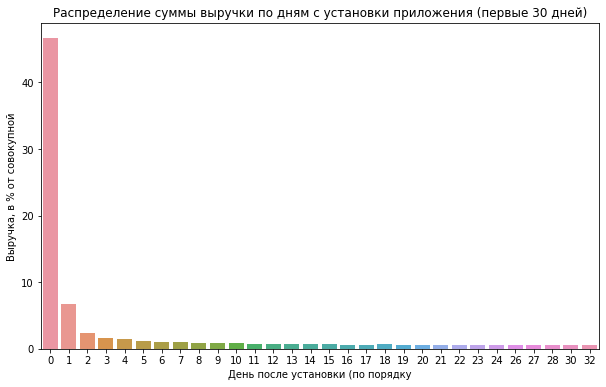

In [48]:
plt.figure(figsize=(10, 6))

sns.barplot(data=a_g.head(30), y='revenue_per', x='day_order')
plt.title('Распределение суммы выручки по дням с установки приложения (первые 30 дней)')
plt.xlabel('День после установки (по порядку')
plt.ylabel('Выручка, в % от совокупной')

In [49]:
# по порядковому номеру покупки
a['order_no'] = a.sort_values('order_date').groupby(['user_id']).cumcount() + 1
print(a.order_no.sum())

558058


In [50]:
a_r = a.groupby('order_no', as_index=False).agg({'revenue': 'sum', 'transaction_id': pd.Series.nunique})
a_r['revenue_per'] = a_r.revenue / a_r.revenue.sum() * 100
a_r['transactions_per'] = a_r.transaction_id / a_r.transaction_id.sum() * 100
a_r

,order_no,revenue,transaction_id,revenue_per,transactions_per
0,1,2.914531e+08,180832,67.299201,63.618134
1,2,7.107942e+07,51073,16.412893,17.967887
2,3,3.071273e+07,22425,7.091852,7.889293
3,4,1.577935e+07,11583,3.643597,4.074991
4,5,8.548092e+06,6516,1.973833,2.292381
...,...,...,...,...,...
239,240,2.700000e+01,1,0.000006,0.000352
240,241,3.100000e+01,1,0.000007,0.000352
241,242,3.000000e+01,1,0.000007,0.000352
242,243,2.800000e+01,1,0.000006,0.000352


Text(0, 0.5, 'Выручка, в % от совокупной')

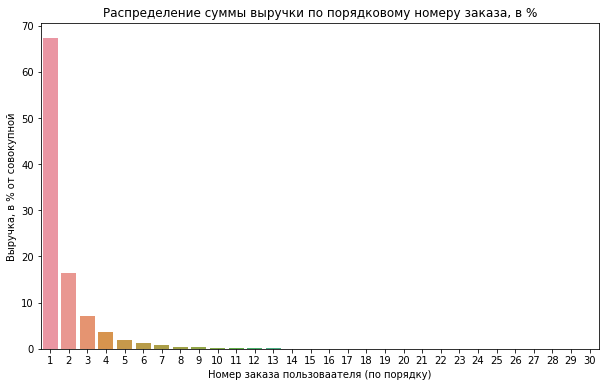

In [51]:
plt.figure(figsize=(10, 6))

sns.barplot(data=a_r.head(30), y='revenue_per', x='order_no')
plt.title('Распределение суммы выручки по порядковому номеру заказа, в %')
plt.xlabel('Номер заказа пользоваателя (по порядку)')
plt.ylabel('Выручка, в % от совокупной')